# Book Recommendation Dataset Acquisition

This notebook handles the **initial data acquisition phase** of the Book Recommendation System project.

## Objectives
1. Download book and user datasets from Kaggle
2. Perform exploratory data analysis (EDA) on each datasetIndexing & operational tips
3. Validate data quality and identify preprocessing needs

## Data SourcesIndexing & operational tips
- **Primary Dataset**: [Book-Crossing Dataset](https://www.kaggle.com/datasets/arashnic/book-recommendation-dataset)
  - Books metadata (ISBN, title, author, publisher, year)
  - User ratings (explicit and implicit feedback)
  - User demographics (location, age)
  
- **Secondary Dataset**: [Amazon Books Reviews](https://www.kaggle.com/datasets/mohamedbakhet/amazon-books-reviews)
  - Additional book metadata
  - Potential for enriching primary dataset

**Notes:**  
- Some files are large (price_books.csv >> 1GB). Expect long reads and occasional parser errors (malformed CSV rows). If you see "EOF inside string" or other tokenizing errors, use the python engine with on_bad_lines='skip' or run a small diagnostic to locate the broken line(s) before re-reading.
- When running profiling (ydata-profiling) on large tables, consider using `minimal=True` or sampling to reduce runtime and memory usage.

## Setup Requirements
- Kaggle API credentials in `.env` file

---
## 1. Environment Setup & Authentication

Configure Kaggle API credentials:
> Please add the following to your .env file:
>> KAGGLE_USERNAME="your_username"  
>> KAGGLE_KEY="your_api_key"

>To get your credentials:
>  1. Go to https://www.kaggle.com/settings/account
>  2. Click 'Create New API Token'
>  3. Extract username and key from downloaded kaggle.json

---
## 2. Dataset Download

Download all required datasets from Kaggle and organize them in the `data/raw/` directory.

### File Mapping
| Source Dataset | Original Filename | Saved As | Purpose |
|----------------|-------------------|----------|---------|
| Book-Crossing | `Books.csv` | `main_books.csv` | Primary book metadata |
| Book-Crossing | `Ratings.csv` | `ratings.csv` | User-book ratings (explicit and implicit feedback) |
| Book-Crossing | `Users.csv` | `users.csv` | User demographic data |
| Amazon Books | `books_data.csv` | `sec_books.csv` | Secondary book metadata for enrichment (categories, description and other metadata)|
| Amazon Books | `Books_rating.csv` | `price_books.csv` | Secondary book Rating data from which we get price information |  

**Result:** The datasets downloaded from kaggle are saved in the `project_root/data/raw/` directory for further processing.  

In [2]:
# Import all necessary libraries
import os
from dotenv import load_dotenv
import kagglehub
from pathlib import Path
import shutil
import numpy as np
import pandas as pd
from ydata_profiling import ProfileReport
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm.auto import tqdm  # For progress bars

# Set matplotlib backend for Jupyter notebooks
%matplotlib inline

# Suppress ydata-profiling upgrade messages
import warnings
warnings.filterwarnings('ignore', message='.*ydata-sdk.*')

In [3]:
# Load credentials from .env file
load_dotenv()
username = os.getenv("KAGGLE_USERNAME")
api_key = os.getenv("KAGGLE_KEY")

if not username or not api_key:
    print("Kaggle credentials not found in .env file!")
    print("Please create a .env file with KAGGLE_USERNAME and KAGGLE_KEY.")
    print("See markdown cell above for instructions.")
    raise ValueError("Missing Kaggle credentials")

# Set environment variables for kagglehub
os.environ['KAGGLE_USERNAME'] = username
os.environ['KAGGLE_KEY'] = api_key

def _get_missing_pairs(files_mapping: dict, target_dir: Path, force: bool) -> list:
    missing = []
    for src_name, tgt_name in files_mapping.items():
        tgt_path = target_dir / tgt_name
        if force or not (tgt_path.exists() and tgt_path.stat().st_size > 0):
            missing.append((src_name, tgt_name))
    return missing

def _copy_files_from_cache(dataset_path: Path, dataset_name: str, missing_pairs: list, target_dir: Path):
    for source_filename, target_filename in missing_pairs:
        source_file = dataset_path / source_filename
        target_file = target_dir / target_filename

        if not source_file.exists():
            # try common alternative: many kaggle downloads extract into a folder named same as dataset
            alt_dir = dataset_path / dataset_name.split("/")[-1]
            alt_source = alt_dir / source_filename
            if alt_source.exists():
                source_file = alt_source
            else:
                print(f"✗ Warning: {source_filename} not found in {dataset_path}. Skipping this file.")
                continue

        print(f"\nCopying {source_filename} -> {target_filename}")
        shutil.copy2(source_file, target_file)
        file_size_mb = target_file.stat().st_size / 1024**2
        print(f"✓ Saved to: {target_file} ({file_size_mb:.2f} MB)")

def _download_and_extract(dataset_name: str) -> Path:
    # Return a Path to the cached download location (as kagglehub provides)
    print("Downloading dataset (cached by kagglehub)...")
    path_str = kagglehub.dataset_download(dataset_name)
    dataset_path = Path(path_str)
    print(f"✓ Downloaded to cache: {dataset_path}")
    return dataset_path

def _compute_relative_target_dir(target_dir: Path) -> str:
    try:
        td = target_dir.resolve()
        # Project root is one level above 'notebooks' directory
        for p in td.parents:
            if (p / "notebooks").exists():
                project_root = p
                break
        rel = "/" + project_root.name + "/" + td.relative_to(project_root).as_posix()
    except Exception:
        rel = target_dir.as_posix()
    return rel

def download_kaggle_datasets(force: bool = False):
    """
    Downloads only missing files from specified Kaggle datasets and saves them to ../data/raw.
    Parameters:
        force (bool): If True, re-downloads datasets even if target files already exist.
    """
    datasets = {
        "mohamedbakhet/amazon-books-reviews": {
            "books_data.csv": "sec_books.csv",
            "Books_rating.csv": "price_books.csv"
        },
        "arashnic/book-recommendation-dataset": {
            "Books.csv":   "main_books.csv",
            "Ratings.csv": "ratings.csv",
            "Users.csv":   "users.csv"
        }
    }

    target_dir = Path("../data/raw")
    target_dir.mkdir(parents=True, exist_ok=True)
    file_names = [tgt_name for files_mapping in datasets.values() for tgt_name in files_mapping.values()]

    for dataset_name, files_mapping in datasets.items():
        missing_pairs = _get_missing_pairs(files_mapping, target_dir, force)
        if not missing_pairs:
            print(f"All files for dataset '{dataset_name}' already present — skipping download.")
            continue

        print(f"\n{'='*60}")
        print(f"Processing dataset: {dataset_name}")
        print(f"{'='*60}")
        try:
            dataset_path = _download_and_extract(dataset_name)
            _copy_files_from_cache(dataset_path, dataset_name, missing_pairs, target_dir)
        except Exception as e:
            print(f"✗ Error downloading or copying files for {dataset_name}: {e}")
            continue

    rel = _compute_relative_target_dir(target_dir)
    print(f"\n{'='*60}")
    print("Download complete!")
    print(f"{'='*60}")
    print(f"All datasets are saved in: {rel}\n")
    print(f"Succefully downloaded {len(file_names)} files: {', '.join(file_names)}")

# call (will only download missing files; pass force=True to re-download everything)
download_kaggle_datasets()


Processing dataset: mohamedbakhet/amazon-books-reviews
✓ Downloaded to cache: /home/pfanyka/.cache/kagglehub/datasets/mohamedbakhet/amazon-books-reviews/versions/1

Copying books_data.csv -> sec_books.csv
✓ Saved to: ../data/raw/sec_books.csv (172.95 MB)
All files for dataset 'arashnic/book-recommendation-dataset' already present — skipping download.

Download complete!
All datasets are saved in: /book_rec_project/data/raw

Succefully downloaded 5 files: sec_books.csv, price_books.csv, main_books.csv, ratings.csv, users.csv


---
## 3. Exploratory Data Analysis (EDA)

Perform comprehensive profiling of each dataset to understand:
- **Data structure**: Column types, missing values, duplicates
- **Statistical properties**: Distributions, correlations, outliers
- **Data quality issues**: Inconsistencies, anomalies, potential errors

We use `ydata-profiling` to generate interactive HTML reports.

### Analysis Approach 
For each dataset, we will:
1. Load each raw CSV into a DataFrame (use chunked readers or the python CSV engine for large files).
2. Produce a compact automated profile (sampled for very large datasets) to surface key issues.
3. Run targeted checks: missing values, duplicate keys, inconsistent types, suspicious dates/prices.
4. Identify data cleaning needs and create a few aggregated artifacts (e.g., df_price_books_agg)

Practical tips
- Heavy cells are marked and may take minutes — monitor kernel memory.
- For reproducibility, prefer deterministic sampling (set random_state) when profiling a subset.
- If you plan to iterate frequently, comment out profiling blocks or use `minimal=True` to speed development.

---
### 3.1 Primary Books Dataset (`main_books.csv`)

**Expected Schema:**
- `ISBN`: International Standard Book Number (unique identifier)
- `Book-Title`: Title of the book
- `Book-Author`: Author name(s)
- `Year-Of-Publication`: Publication year
- `Publisher`: Publishing house
- `Image-URL-S/M/L`: Cover image URLs (small/medium/large)

**Key Questions:**
- Are ISBNs truly unique?
- How many books have missing data (authors, publication years, etc)?
- What are the variables' distributions?

In [3]:
# Load primary books dataset
print("Loading main_books.csv...")

df_books = pd.read_csv("../data/raw/main_books.csv", sep=',',low_memory=False)
print("Generating profiling report for Books dataset...")
print("⏳ This may take a few minutes for large datasets...")

print(f"\n Dataset Shape: {df_books.shape[0]:,} rows × {df_books.shape[1]} columns")
print("\nColumn Data Types:")
display(df_books.dtypes)

# Change Year-Of-Publication to numeric type
df_books['Year-Of-Publication'] = pd.to_numeric(df_books['Year-Of-Publication'], errors='coerce')

profile_books = ProfileReport(
    df_books, 
    title="📚 Main Books Dataset - Profiling Report",
    explorative=True,
    dataset={
        "description": "Primary book metadata from Book-Crossing dataset (271,360 books)",
        "creator": "Book-Crossing Community",
        "url": "https://www.kaggle.com/datasets/arashnic/book-recommendation-dataset"
    }
)

# Display in notebook
profile_books.to_notebook_iframe()

Loading main_books.csv...


Generating profiling report for Books dataset...
⏳ This may take a few minutes for large datasets...

 Dataset Shape: 271,360 rows × 8 columns

Column Data Types:


ISBN                   object
Book-Title             object
Book-Author            object
Year-Of-Publication    object
Publisher              object
Image-URL-S            object
Image-URL-M            object
Image-URL-L            object
dtype: object

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

100%|██████████| 8/8 [00:43<00:00,  5.45s/it]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Year-Of-Publication Statistics:
count    271357.000000
mean       1959.760817
std         257.994226
min           0.000000
25%        1989.000000
50%        1995.000000
75%        2000.000000
max        2050.000000
Name: Year-Of-Publication, dtype: float64

Missing values: 3
Min year: 0.0
Max year: 2050.0

⚠️ Books with suspicious publication years: 4,632

Sample of suspicious entries:


,ISBN,Book-Title,Book-Author,Year-Of-Publication
176,3150000335,Kabale Und Liebe,Schiller,0.0
188,342311360X,Die Liebe in Den Zelten,Gabriel Garcia Marquez,0.0
288,0571197639,Poisonwood Bible Edition Uk,Barbara Kingsolver,0.0
351,3596214629,"Herr Der Fliegen (Fiction, Poetry and Drama)",Golding,0.0
542,8845229041,Biblioteca Universale Rizzoli: Sulla Sponda De...,P Coelho,0.0
641,0345251733,Rainbow the Stormy Life of Judy Garland,Christopher Finch,0.0
646,0590021117,Little House On the Prairie,Laura Ingall Wilder,0.0
728,2070362388,Ravage,Rene Barjavel,0.0
732,2266033689,Le Diable Au Corps,Raymond Radiguet,0.0
735,2070334368,La Guerre Des Boutons,Pergaud,0.0


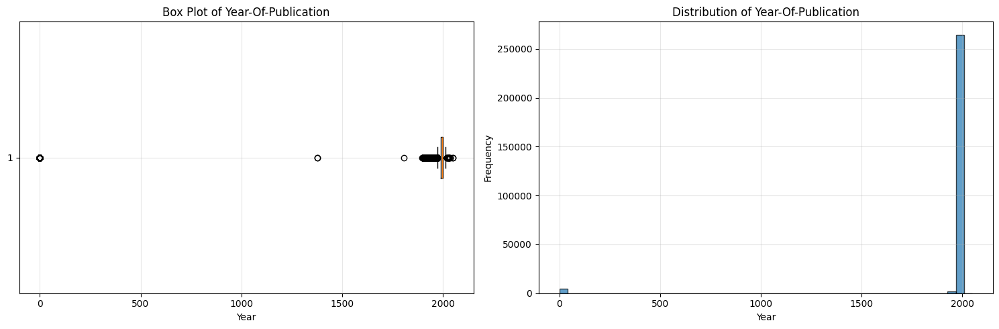

In [4]:
# Analyze Year-Of-Publication for outliers

# Display basic statistics
print("Year-Of-Publication Statistics:")
print(df_books['Year-Of-Publication'].describe())
print(f"\nMissing values: {df_books['Year-Of-Publication'].isnull().sum():,}")
print(f"Min year: {df_books['Year-Of-Publication'].min()}")
print(f"Max year: {df_books['Year-Of-Publication'].max()}")

# Create visualizations
fig, axes = plt.subplots(1, 2, figsize=(15, 5))

# Box plot to identify outliers
axes[0].boxplot(df_books['Year-Of-Publication'].dropna(), vert=False)
axes[0].set_title('Box Plot of Year-Of-Publication')
axes[0].set_xlabel('Year')
axes[0].grid(True, alpha=0.3)

# Histogram to see distribution
axes[1].hist(df_books['Year-Of-Publication'].dropna(), bins=50, edgecolor='black', alpha=0.7)
axes[1].set_title('Distribution of Year-Of-Publication')
axes[1].set_xlabel('Year')
axes[1].set_ylabel('Frequency')
axes[1].grid(True, alpha=0.3)

plt.tight_layout()
# Remove plt.show() - in Jupyter, plots display automatically with %matplotlib inline
# plt.show()

# Identify suspicious years (e.g., before 1450 - Gutenberg printing press, or after current year)
current_year = 2025
suspicious_years = df_books[
    (df_books['Year-Of-Publication'] < 1450) | 
    (df_books['Year-Of-Publication'] > current_year)
]

print(f"\n⚠️ Books with suspicious publication years: {len(suspicious_years):,}")
if len(suspicious_years) > 0:
    print("\nSample of suspicious entries:")
    display(suspicious_years[['ISBN', 'Book-Title', 'Book-Author', 'Year-Of-Publication']].head(10))

**Note:** While we enrich this dataset we might be able to fill in missing/incorrect values for authors and publication years using the secondary dataset.  

---

### 3.2 Users Dataset (`users.csv`)

**Expected Schema:**
- `User-ID`: Unique user identifier
- `Location`: User's location (city, state, country)
- `Age`: User's age (may contain null or invalid values)

**Key Questions:**
- What is the geographic distribution of users?
- Are there age outliers or missing values?
- How many unique users are in the system?

In [3]:
# Load users dataset
print("Loading users.csv...")
df_users = pd.read_csv("../data/raw/users.csv", sep=',', low_memory=False)

print(f"\nDataset Shape: {df_users.shape[0]:,} rows × {df_users.shape[1]} columns")
print("\nColumn Data Types:")
display(df_users.dtypes)

def extract_location_components(df: pd.DataFrame, location_column: str = "Location", user_id_col: str = "User-ID"):
    """
    Splits 'Location' into City, State, Country using vectorized ops.
    Returns (df_with_columns, problematic_locations_dict).
    """
    s = df[location_column].astype(str)

    # Split into at most 3 parts: City, State, Country
    parts = s.str.split(",", n=2, expand=True)

    # Ensure exactly 3 columns
    while parts.shape[1] < 3:
        parts[parts.shape[1]] = None

    # Strip whitespace and normalize empties to NA
    for i in range(3):
        parts[i] = parts[i].astype(str).str.strip().replace({"": pd.NA, "nan": pd.NA})

    out = df.copy()
    out[["City", "State", "Country"]] = parts[[0, 1, 2]]

    # all_problematic if not exactly 2 commas or any of the 3 parts missing
    mask = s.str.count(",").ne(2) | out[["City", "State", "Country"]].isna().any(axis=1)

    # not_city problematic locations
    not_city_problematic = out.loc[mask & out["City"].isna(), [user_id_col, location_column]]

    all_problematic = (
        out.loc[mask, [user_id_col, location_column]]
        .dropna(subset=[user_id_col])  # guard against bad rows
        .set_index(user_id_col)[location_column]
        .to_dict()
    )

    return out, all_problematic, not_city_problematic

# Apply
df_users_transf, all_problematic, not_city_problematic = extract_location_components(df_users, "Location", "User-ID")

print(f"\nUsers with problematic Location format: {len(all_problematic):,} "
      f"({len(all_problematic) / df_users_transf.shape[0] * 100:.2f}% of total users)")

print(f"\nUsers with problematic Location format (missing City): {not_city_problematic.shape[0]:,} "
      f"({not_city_problematic.shape[0] / df_users_transf.shape[0] * 100:.2f}% of total users)")

print("\nSample of problematic locations:")
display(pd.Series(all_problematic).head(15).to_frame("Location"))

Loading users.csv...

Dataset Shape: 278,858 rows × 3 columns

Column Data Types:


User-ID       int64
Location     object
Age         float64
dtype: object


Users with problematic Location format: 6,837 (2.45% of total users)

Users with problematic Location format (missing City): 122 (0.04% of total users)

Sample of problematic locations:


,Location
19,"weston, ,"
91,"toronto/newmarket, ,"
312,"lk, jlk,"
318,"berlin, n/a,"
436,"ivanhoe, melbourne, victoria, australia"
537,"davis, california,"
558,"burnaby, ,"
730,"albuquerque, new mexico,"
767,"omaha, nebr,"
777,"portland, ,"


In [4]:
# Profiling report for users dataset
print("Generating profiling report for users dataset...")
print("⏳ This may take a few minutes for large datasets...")

print(f"\n Dataset Shape: {df_users.shape[0]:,} rows × {df_users.shape[1]} columns")
print("\nColumn Data Types:")
display(df_users.dtypes)

profile_users = ProfileReport(
    df_users, 
    title="👥 Users Dataset - Profiling Report",
    explorative=True,
    dataset={
        "description": "User metadata from Book-Crossing dataset (278,858 users)",
        "creator": "Book-Crossing Community",
        "url": "https://www.kaggle.com/datasets/arashnic/book-recommendation-dataset"
    }
)

# Display in notebook
profile_users.to_notebook_iframe()

Generating profiling report for users dataset...
⏳ This may take a few minutes for large datasets...

 Dataset Shape: 278,858 rows × 3 columns

Column Data Types:


User-ID       int64
Location     object
Age         float64
dtype: object

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

100%|██████████| 3/3 [00:01<00:00,  1.81it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

---
### 3.3 Ratings Dataset (`ratings.csv`)

**Expected Schema:**
- `User-ID`: Foreign key to users table
- `ISBN`: Foreign key to books table
- `Book-Rating`: Rating value (0-10 scale, where 0 = implicit feedback, in other words, the user purchased/view/has the book but did not provide an explicit rating, >0 = explicit rating)

**Key Questions:**
- What is the distribution of ratings?
- How many implicit (rating=0) vs explicit ratings?
- Are there users/books with unusually high rating counts?
- What is the sparsity of the user-item matrix?

**Warning:**  
- The distribution of ratings value may be skewed by the large number of implicit ratings (0s). Consider analyzing explicit ratings separately, to avoid bias in understanding user preferences and obtaining accurate insights.
-  We might want to calculate the books' average rating excluding the implicit ratings (0s). 

In [6]:
# Load ratings dataset
print("Loading ratings.csv...")
df_ratings = pd.read_csv("../data/raw/ratings.csv", sep=',', low_memory=False)

print(f"\nDataset Shape: {df_ratings.shape[0]:,} rows × {df_ratings.shape[1]} columns")

print("\nColumn Data Types:")
display(df_ratings.dtypes)

# Rating distribution
print("\nRating Distribution:")
display(df_ratings['Book-Rating'].value_counts().sort_index())

# Sparsity calculation
n_users = df_ratings['User-ID'].nunique()
n_books = df_ratings['ISBN'].nunique()
n_ratings = len(df_ratings)
sparsity = 1 - (n_ratings / (n_users * n_books))

print("\nSparsity Metrics:")
print(f"  Unique users: {n_users:,}")
print(f"  Unique books: {n_books:,}")
print(f"  Total ratings: {n_ratings:,}")
print(f"  Matrix sparsity: {sparsity:.4%}")

Loading ratings.csv...

Dataset Shape: 1,149,780 rows × 3 columns

Column Data Types:


User-ID         int64
ISBN           object
Book-Rating     int64
dtype: object


Rating Distribution:


Book-Rating
0     716109
1       1770
2       2759
3       5996
4       8904
5      50974
6      36924
7      76457
8     103736
9      67541
10     78610
Name: count, dtype: int64


Sparsity Metrics:
  Unique users: 105,283
  Unique books: 340,556
  Total ratings: 1,149,780
  Matrix sparsity: 99.9968%


In [7]:
# Generate profiling report for ratings
print("Generating profiling report for Ratings dataset...")
print("⏳ This is the largest dataset and may take several minutes...")

profile_ratings = ProfileReport(
    df_ratings,
    title="⭐ Ratings Dataset - Profiling Report",
    explorative=True,
    dataset={
        "description": "User-book ratings from Book-Crossing dataset (1,149,780 ratings)",
        "creator": "Book-Crossing Community",
        "url": "https://www.kaggle.com/datasets/arashnic/book-recommendation-dataset"
    },
    # Optimize for large dataset
    minimal=False,
    correlations={
        "auto": {"calculate": True},
        "pearson": {"calculate": True},
        "spearman": {"calculate": False},  # Skip to save time
        "kendall": {"calculate": False},
        "phi_k": {"calculate": False},
        "cramers": {"calculate": False}
    }
)

profile_ratings.to_notebook_iframe()

Generating profiling report for Ratings dataset...
⏳ This is the largest dataset and may take several minutes...


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

100%|██████████| 3/3 [00:06<00:00,  2.03s/it]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

---
### 3.4 Secondary Books Dataset (`sec_books.csv`)

**Purpose:** This dataset from Amazon Books may contain additional metadata (e.g., descriptions, categories, prices) that can enrich our primary dataset through ISBN matching.

**Expected Schema:** (To be determined from profiling)

**Key Questions:**
- What additional features are available?
- What is the overlap with the primary books dataset?
- Can we use this for category/genre information?

In [8]:
# Load secondary books dataset
print("Loading sec_books.csv...")
df_sec_books = pd.read_csv("../data/raw/sec_books.csv", sep=',', low_memory=False)

print(f"\nDataset Shape: {df_sec_books.shape[0]:,} rows × {df_sec_books.shape[1]} columns")
print("\n First 5 rows:")
display(df_sec_books.head())

print("\n Column Data Types:")
display(df_sec_books.dtypes)

print("\n Missing Values:")
display(df_sec_books.isnull().sum())

# get only year-of-publication from 'Publication-Date' column
df_sec_books['Year-Of-Publication'] = pd.to_datetime(df_sec_books['publishedDate'], errors='coerce').dt.year
print("\n Updated Data Types after Year-Of-Publication extraction:")
display(df_sec_books.dtypes)
    

Loading sec_books.csv...

Dataset Shape: 212,404 rows × 10 columns

 First 5 rows:


,Title,description,authors,image,previewLink,publisher,publishedDate,infoLink,categories,ratingsCount
0,Its Only Art If Its Well Hung!,NaN,['Julie Strain'],http://books.google.com/books/content?id=DykPA...,http://books.google.nl/books?id=DykPAAAACAAJ&d...,NaN,1996,http://books.google.nl/books?id=DykPAAAACAAJ&d...,['Comics & Graphic Novels'],NaN
1,Dr. Seuss: American Icon,Philip Nel takes a fascinating look into the k...,['Philip Nel'],http://books.google.com/books/content?id=IjvHQ...,http://books.google.nl/books?id=IjvHQsCn_pgC&p...,A&C Black,2005-01-01,http://books.google.nl/books?id=IjvHQsCn_pgC&d...,['Biography & Autobiography'],NaN
2,Wonderful Worship in Smaller Churches,This resource includes twelve principles in un...,['David R. Ray'],http://books.google.com/books/content?id=2tsDA...,http://books.google.nl/books?id=2tsDAAAACAAJ&d...,NaN,2000,http://books.google.nl/books?id=2tsDAAAACAAJ&d...,['Religion'],NaN
3,Whispers of the Wicked Saints,Julia Thomas finds her life spinning out of co...,['Veronica Haddon'],http://books.google.com/books/content?id=aRSIg...,http://books.google.nl/books?id=aRSIgJlq6JwC&d...,iUniverse,2005-02,http://books.google.nl/books?id=aRSIgJlq6JwC&d...,['Fiction'],NaN
4,"Nation Dance: Religion, Identity and Cultural ...",NaN,['Edward Long'],NaN,http://books.google.nl/books?id=399SPgAACAAJ&d...,NaN,2003-03-01,http://books.google.nl/books?id=399SPgAACAAJ&d...,NaN,NaN



 Column Data Types:


Title             object
description       object
authors           object
image             object
previewLink       object
publisher         object
publishedDate     object
infoLink          object
categories        object
ratingsCount     float64
dtype: object


 Missing Values:


Title                 1
description       68442
authors           31413
image             52075
previewLink       23836
publisher         75886
publishedDate     25305
infoLink          23836
categories        41199
ratingsCount     162652
dtype: int64


 Updated Data Types after Year-Of-Publication extraction:


Title                   object
description             object
authors                 object
image                   object
previewLink             object
publisher               object
publishedDate           object
infoLink                object
categories              object
ratingsCount           float64
Year-Of-Publication    float64
dtype: object

In [9]:
print("Generating profiling report for Secondary Books dataset...")

profile_sec_books = ProfileReport(
    df_sec_books,
    title="📦 Secondary Books Dataset (Amazon) - Profiling Report",
    explorative=True,
    dataset={
        "description": "Amazon books metadata for potential enrichment",
        "creator": "Amazon Books Dataset",
        "url": "https://www.kaggle.com/datasets/mohamedbakhet/amazon-books-reviews"
    }
)

profile_sec_books.to_notebook_iframe()

Generating profiling report for Secondary Books dataset...


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

100%|██████████| 11/11 [00:56<00:00,  5.12s/it]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

**Note:** This year of publication has more missing data that date of publication

,authors,authors_parsed,n_authors
0,['Julie Strain'],[Julie Strain],1
1,['Philip Nel'],[Philip Nel],1
2,['David R. Ray'],[David R. Ray],1
3,['Veronica Haddon'],[Veronica Haddon],1
4,['Edward Long'],[Edward Long],1
...,...,...,...
212399,['Elvira Woodruff'],[Elvira Woodruff],1
212400,NaN,[],0
212401,['Wild Wild Cabbage'],[Wild Wild Cabbage],1
212402,['Zadie Smith'],[Zadie Smith],1


,Count,Percentage
n_authors,,
0,31413,14.79
1,145611,68.55
2,26810,12.62
3,6180,2.91
4,1511,0.71
5,464,0.22
6,174,0.08
7,82,0.04
8,42,0.02


/tmp/ipykernel_405962/539163125.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='n_authors', y='Count', data=plot_df, palette='C0', ax=ax)


ValueError: 'C0' is not a valid palette name

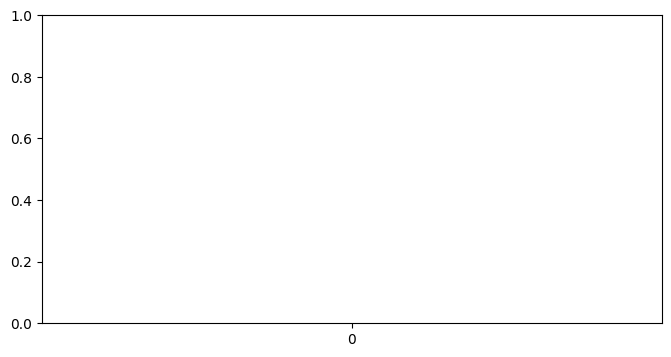

In [ ]:
import ast

def parse_authors(x):
    # Return a list of authors from various possible representations
    if pd.isna(x):
        return []
    if isinstance(x, (list, tuple)):
        return list(x)
    if isinstance(x, str):
        s = x.strip()
        # Try to safely parse literal lists like "['A', 'B']"
        if s.startswith('[') and s.endswith(']'):
            try:
                v = ast.literal_eval(s)
                if isinstance(v, (list, tuple)):
                    return list(v)
            except Exception:
                pass
        # Fallback: treat the whole string as one author (avoid naive splitting on commas)
        return [s]
    return []

# Parse and count authors
df_sec_books['authors_parsed'] = df_sec_books['authors'].apply(parse_authors)
df_sec_books['n_authors'] = df_sec_books['authors_parsed'].apply(len)
#display 5 examples per observed number of authors
display(df_sec_books[['authors', 'authors_parsed', 'n_authors']])
# Distribution table
counts = df_sec_books['n_authors'].value_counts().sort_index()
summary = pd.DataFrame({
    'Count': counts,
    'Percentage': (counts / counts.sum() * 100).round(2)
})
display(summary)

# Bar plot of distribution
plot_df = summary.reset_index().rename(columns={'index': 'n_authors'})
fig, ax = plt.subplots(figsize=(8,4))
# Use a single color instead of passing `palette` without `hue`
sns.barplot(x='n_authors', y='Count', data=plot_df, color='C0', ax=ax)
ax.set_title('Distribution of number of authors per book')
ax.set_xlabel('Number of authors')
ax.set_ylabel('Count of books')
for i, row in plot_df.iterrows():
    ax.text(i, row['Count'], f"{int(row['Count']):,}\n{row['Percentage']}%", ha='center', va='bottom', fontsize=9)
plt.tight_layout()

# Quick examples of multi-author books
multi = df_sec_books[df_sec_books['n_authors'] > 1]
print(f"Total books: {len(df_sec_books):,}")
print(f"Books with >1 authors: {len(multi):,} ({len(multi) / len(df_sec_books) * 100:.2f}%)")
display(multi[['Title', 'authors', 'n_authors']].head(10))


**NOTE:** The book id, also known as isbn, is not present in the previous dataset onlu in the next one, so to link the two datasets we have the title of the book. We will have to perform some data cleaning and preprocessing to ensure accurate matching between the two datasets based on book titles.  

---
### 3.5 Price Books Dataset (`price_books.csv`)

**Purpose:** This dataset from Amazon Books contains pricing information and additional metadata that can be used to enrich our primary dataset and potentially provide insights into book ratings based on price points.

**Key Questions:**
- What pricing information is available?
- Is there a correlation between book prices and ratings?
- What is the overlap with the primary books dataset?
- Can we identify pricing tiers or categories?
- Are there any outliers in pricing data?

**Key Points:**
- We create an aggregated price table (df_price_books_agg) that contains one price record per ISBN (mean or first observed as appropriate). That aggregated table is what downstream imputation and modeling use.

**Imputation & modeling plan**
- Initial exploratory steps:
  - Identify and report price==0, missing prices, and IQR-based outliers.
  - Visualize distributions and inspect extreme cases before deciding removal.
- Imputation options to consider:
  1. Probabilistic sampler: sample from the cleaned empirical price distribution (fast baseline).
  2. Metadata-based predictor: simple KNN/Ridge regression using title TF-IDF + publication year + publisher/author encodings (baseline ML).
  3. More advanced: use embeddings for title/author/publisher and tree-based regressors with cross-validation.
- For modeling evaluation we can use 5-fold CV and report RMSE/MAE/R2 on held-out labeled prices.

**Actionable notes**
- Keep all aggregated prices in df_price_books_agg (including expensive/rare books) so you can experiment with thresholds and categorical bins without data loss.


In [10]:
# Load price books dataset with batch processing
print("Loading price_books.csv with batch processing...")
print("⏳ Processing large file (>2.5 GB) in chunks...\n")

# Define columns to keep (filter early to save memory)
columns_to_keep = ['Id', 'Title', 'Price']
batch_size = 30000

print(f"  - Batch size: {batch_size:,} rows")
print(f"  - Keeping columns: {columns_to_keep}")
print("  - This may take several minutes...\n")

# Initialize list to store filtered chunks
price_chunks = []
total_rows_processed = 0
total_rows_kept = 0

try:
    # First pass: count total chunks for progress bar
    print("📊 Counting total rows...")
    total_chunks = sum(1 for _ in pd.read_csv(
        "../data/raw/price_books.csv",
        sep=',',
        usecols=['Id'],  # Just one column for speed
        chunksize=batch_size,
        low_memory=False
    ))
    print(f"   Found ~{total_chunks * batch_size:,} rows in {total_chunks} chunks\n")
    
    # Second pass: actual loading with progress bar
    print("💾 Loading and filtering data...")
    chunk_iterator = pd.read_csv(
        "../data/raw/price_books.csv", 
        sep=',',
        usecols=columns_to_keep,
        chunksize=batch_size,
        low_memory=False
    )
    
    # Wrap with tqdm for progress bar
    for chunk in tqdm(chunk_iterator, total=total_chunks, desc="Processing chunks", unit="chunk"):
        # Drop rows with missing Id or Price (critical fields)
        chunk_clean = chunk.dropna(subset=['Id', 'Price'])
        
        # Track stats
        total_rows_processed += len(chunk)
        total_rows_kept += len(chunk_clean)
        
        # Add to list
        price_chunks.append(chunk_clean)
    
    # Concatenate all chunks
    print("\n🔗 Concatenating chunks...")
    df_price_books = pd.concat(price_chunks, ignore_index=True)
    
    # Summary
    print(f"\n{'='*60}")
    print("✓ Loading Complete!")
    print(f"{'='*60}")
    print(f"  Total rows read:      {total_rows_processed:,}")
    print(f"  Rows with valid data: {total_rows_kept:,}")
    print(f"  Rows dropped:         {total_rows_processed - total_rows_kept:,} ({(total_rows_processed - total_rows_kept) / total_rows_processed * 100:.2f}%)")
    print(f"  Memory saved:         ~{(1 - len(columns_to_keep) / 10) * 100:.0f}% (loaded {len(columns_to_keep)}/~10 columns)")
    print(f"{'='*60}\n")
    
except Exception as e:
    print(f"\n✗ Error loading file: {str(e)}")
    df_price_books = pd.DataFrame()  # Empty fallback

Loading price_books.csv with batch processing...
⏳ Processing large file (>2.5 GB) in chunks...

  - Batch size: 30,000 rows
  - Keeping columns: ['Id', 'Title', 'Price']
  - This may take several minutes...

📊 Counting total rows...


   Found ~3,000,000 rows in 100 chunks

💾 Loading and filtering data...


Processing chunks:   0%|          | 0/100 [00:00<?, ?chunk/s]


🔗 Concatenating chunks...

✓ Loading Complete!
  Total rows read:      3,000,000
  Rows with valid data: 481,171
  Rows dropped:         2,518,829 (83.96%)
  Memory saved:         ~70% (loaded 3/~10 columns)



In [11]:
# profile price data 
print("Generating profiling report for Price Books dataset...")
profile_price_books = ProfileReport(
    df_price_books,    
    title="💲 Price Books Dataset - Profiling Report",
    explorative=True,
    dataset={
        "description": "Book price data from Amazon Books dataset",
        "creator": "Amazon Books Dataset",
        "url": "https://www.kaggle.com/datasets/mohamedbakhet/amazon-books-reviews"
    }
)
profile_price_books.to_notebook_iframe()   

Generating profiling report for Price Books dataset...


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

100%|██████████| 3/3 [00:03<00:00,  1.06s/it]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [12]:
# Display dataset overview
if not df_price_books.empty:
    print(f"📋 Dataset Shape: {df_price_books.shape[0]:,} rows × {df_price_books.shape[1]} columns\n")
    
    print("First 10 rows:")
    display(df_price_books.head(10))
    
    print("\nColumn Data Types:")
    display(df_price_books.dtypes)
    
    print("\nMissing Values:")
    display(df_price_books.isnull().sum())
    
    # Rename 'Id' to 'ISBN' for consistency
    df_price_books = df_price_books.rename(columns={'Id': 'ISBN'})
    
    # Price statistics (assuming USD)
    print("\n💵 Price Statistics (USD):")
    print(df_price_books['Price'].describe())
    
    # Detect outliers
    q1 = df_price_books['Price'].quantile(0.25)
    q3 = df_price_books['Price'].quantile(0.75)
    iqr = q3 - q1
    outliers = df_price_books[(df_price_books['Price'] < q1 - 1.5*iqr) | (df_price_books['Price'] > q3 + 1.5*iqr)]
    print(f"   Outliers detected: {len(outliers):,} ({len(outliers)/len(df_price_books)*100:.2f}%)")
    
    # Check for duplicate ISBNs with different prices
    print("\n" + "="*60)
    print("🔍 Duplicate ISBN Analysis:")
    print("="*60)
    
    # First, check if there are any price variations at all
    isbn_price_variation = df_price_books.groupby('ISBN')['Price'].agg(['std', 'count'])
    has_price_variations = (isbn_price_variation['std'] > 0).any()
    total_duplicates = (isbn_price_variation['count'] > 1).sum()
    
    print(f"ISBNs with multiple entries: {total_duplicates:,} / {df_price_books['ISBN'].nunique():,} unique ISBNs")
    print(f"                             ({total_duplicates / df_price_books['ISBN'].nunique() * 100:.2f}% have duplicates)")
    
    if has_price_variations:
        print("\n⚠️ Price variations detected across duplicate ISBNs!")
        
        # Calculate full statistics only if there are variations
        isbn_counts = df_price_books.groupby('ISBN').agg({
            'Price': ['count', 'mean', 'std', 'min', 'max'],
            'Title': 'first'
        }).round(2)
        
        isbn_counts.columns = ['count', 'avg_price_usd', 'price_std', 'min_price_usd', 'max_price_usd', 'title']
        duplicate_isbns = isbn_counts[isbn_counts['count'] > 1].sort_values('count', ascending=False)
        
        # Filter to only ISBNs with actual price variations (std > 0)
        varied_prices = duplicate_isbns[duplicate_isbns['price_std'] > 0]
        
        if len(varied_prices) > 0:
            print("\nPrice Variance Analysis:")
            print(f"  - ISBNs with varying prices:  {len(varied_prices):,} ({len(varied_prices) / total_duplicates * 100:.2f}% of duplicates)")
            print(f"  - ISBNs with price std > $5:  {(varied_prices['price_std'] > 5).sum():,}")
            print(f"  - ISBNs with price std > $10: {(varied_prices['price_std'] > 10).sum():,}")
            print(f"  - Max price range:            ${varied_prices['min_price_usd'].min():.2f} - ${varied_prices['max_price_usd'].max():.2f}")
            
            print("\n🔝 Top 10 ISBNs with highest price variations:")
            display(varied_prices.sort_values('price_std', ascending=False)[['title', 'count', 'avg_price_usd', 'price_std', 'min_price_usd', 'max_price_usd']].head(10))
        
        # Create aggregated version with statistics
        print("\n" + "="*60)
        print("📊 Creating Aggregated Dataset with Price Statistics:")
        print("="*60)
        
        df_price_books_agg = df_price_books.groupby('ISBN', as_index=False).agg({
            'Title': 'first',
            'Price': ['mean', 'count', 'std']
        })
        
        df_price_books_agg.columns = ['ISBN', 'Title', 'Price_USD_Avg', 'Price_Count', 'Price_StdDev']
        df_price_books_agg['Price_USD_Avg'] = df_price_books_agg['Price_USD_Avg'].round(2)
        df_price_books_agg['Price_StdDev'] = df_price_books_agg['Price_StdDev'].round(2)
        
    else:
        print("\n✓ All duplicate ISBNs have identical prices (std = 0)")
        print("   → Using simple aggregation (first price per ISBN)")
        
        # Create simplified aggregated version (just take first price)
        print("\n" + "="*60)
        print("📊 Creating Aggregated Dataset (simple - no price variations):")
        print("="*60)
        
        df_price_books_agg = df_price_books.groupby('ISBN', as_index=False).agg({
            'Title': 'first',
            'Price': 'first'  # Just take first price since they're all the same
        })
        
        df_price_books_agg.columns = ['ISBN', 'Title', 'Price_USD']
        df_price_books_agg['Price_USD'] = df_price_books_agg['Price_USD'].round(2)
    
    print(f"Aggregated dataset: {len(df_price_books_agg):,} unique books")
    print("\nSample of aggregated data:")
    display(df_price_books_agg.head(10))
    
    # Overlap analysis with main books dataset
    if 'df_books' in locals():
        print("\n" + "="*60)
        print("🔗 Overlap Analysis with Primary Books Dataset:")
        print("="*60)
        
        overlap_isbns = set(df_price_books_agg['ISBN']) & set(df_books['ISBN'])
        print(f"ISBNs in both datasets:        {len(overlap_isbns):,}")
        print(f"  - % of primary books:        {len(overlap_isbns) / len(df_books) * 100:.2f}%")
        print(f"  - % of price data matched:   {len(overlap_isbns) / len(df_price_books_agg) * 100:.2f}%")
        
        # Books with prices available
        df_books_with_price = df_books[df_books['ISBN'].isin(overlap_isbns)]
        print(f"\n✓ {len(df_books_with_price):,} books from primary dataset now have price data!")
else:
    print("⚠️ Warning: No valid data loaded")

📋 Dataset Shape: 481,171 rows × 3 columns

First 10 rows:


,Id,Title,Price
0,0829814000,Wonderful Worship in Smaller Churches,19.40
1,0829814000,Wonderful Worship in Smaller Churches,19.40
2,0829814000,Wonderful Worship in Smaller Churches,19.40
3,0829814000,Wonderful Worship in Smaller Churches,19.40
4,0595344550,Whispers of the Wicked Saints,10.95
5,0595344550,Whispers of the Wicked Saints,10.95
6,0595344550,Whispers of the Wicked Saints,10.95
7,0595344550,Whispers of the Wicked Saints,10.95
8,0595344550,Whispers of the Wicked Saints,10.95
9,0595344550,Whispers of the Wicked Saints,10.95



Column Data Types:


Id        object
Title     object
Price    float64
dtype: object


Missing Values:


Id       0
Title    7
Price    0
dtype: int64


💵 Price Statistics (USD):
count    481171.000000
mean         21.762656
std          26.206541
min           1.000000
25%          10.780000
50%          14.930000
75%          23.950000
max         995.000000
Name: Price, dtype: float64
   Outliers detected: 39,983 (8.31%)

🔍 Duplicate ISBN Analysis:
ISBNs with multiple entries: 36,152 / 49,080 unique ISBNs
                             (73.66% have duplicates)

✓ All duplicate ISBNs have identical prices (std = 0)
   → Using simple aggregation (first price per ISBN)

📊 Creating Aggregated Dataset (simple - no price variations):
Aggregated dataset: 49,080 unique books

Sample of aggregated data:


,ISBN,Title,Price_USD
0,0002554232,The Red Shoes: Margaret Atwood Starting Out,24.32
1,0004332466,Collins Paperback Thesaurus: In A to Z Form,8.95
2,0005993814,Common Worship Today,35.00
3,0006482724,Lilith's Castle,13.99
4,0007104022,Vikings,18.99
5,0007118481,TO END ALL WARS,10.45
6,0007155115,Essential Spike Milligan,16.81
7,0007176171,Irish Babies Names (Collins Gem),9.95
8,0007193092,366 Celt: A Year and a Day of Celtic Wisdom an...,16.99
9,0007203039,The Times Good University Guide 2006,30.00



🔗 Overlap Analysis with Primary Books Dataset:
ISBNs in both datasets:        4,092
  - % of primary books:        1.51%
  - % of price data matched:   8.34%

✓ 4,092 books from primary dataset now have price data!


Assessing price distribution...
Total aggregated books: 49,080
  Missing prices: 0
  Price == 0:     0 (0.00%)
  Positive prices available: 49,080
  IQR outliers:   5,502 (11.21% of positive prices)
    Upper Bound:  57.0 USD
    Lower Bound: -15.0 USD

Top positive outliers (highest outlier prices):


,ISBN,Title,Price_USD
16154,0763706418,Visual Genetics Plus: Tutorial and Lab Simulat...,995.00
7764,0471387363,"Advances in Chemical Physics, Volume 119: Mode...",890.00
14004,072168291X,Youmans Neurological Surgery (Four Volume Set),875.00
41175,1855068303,Chicago School Pragmatism (History of American...,840.00
41176,1855069172,"Leechdoms, Wortcunning and Starcraft",840.00
18266,0792329562,Encyclopedia of Phenomenology (Contributions t...,809.99
74,0028657748,Encyclopedia of Bioethics (5 Volume Set),807.30
945,0122267354,"Encyclopedia of Stress, Three-Volume Set",800.00
29706,0966934520,Standard Warehouse Management System Search Bu...,795.00
13843,0710618867,The Future of Europe's Aerospace Industry (Jan...,795.00



Bottom outliers (lowest outlier prices):


,ISBN,Title,Price_USD
8794,0520230302,Water and American Government: The Reclamation...,57.11
1117,0130990914,Scientific Revolutions: Primary Texts in the H...,57.17
1852,019507386X,Feminist Methods in Social Research,57.22
13588,0691021287,The Unified Neutral Theory of Biodiversity and...,57.23
1021,013029442X,Cities and Privatization: Prospects for the Ne...,57.24
9182,0521436176,Liberal Rights: Collected Papers 1981-1991 (Ca...,57.24
2508,0201433079,Advanced Programming in the UNIX Environment (...,57.26
6512,041526829X,Media Spectacle,57.26
18942,0802088171,Exorcism and Its Texts: Subjectivity in Early ...,57.28
25354,0878301046,Dance Technique and Injury Prevention,57.33



Cleaned price stats (positive, excluding IQR outliers):


count    43578.00
mean        19.43
std         11.26
min          1.00
25%         11.64
50%         16.47
75%         24.95
max         57.00
Name: Price_USD, dtype: float64

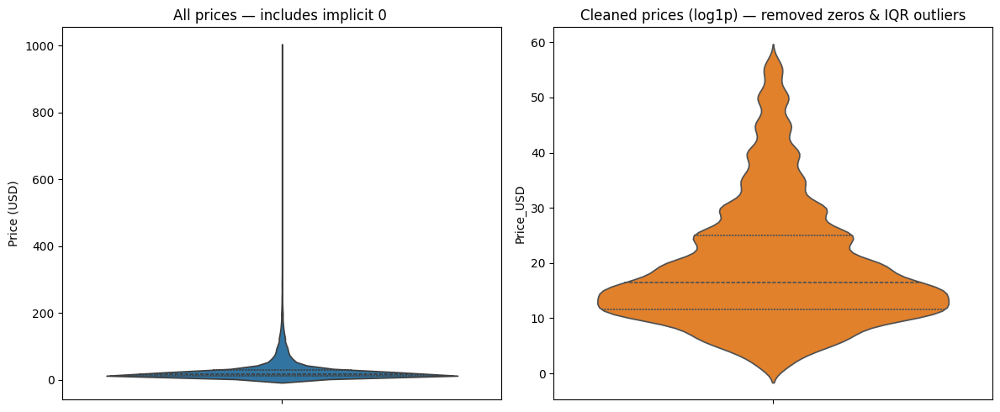

In [ ]:
# assess price distribution in possible categories
print("Assessing price distribution...")

# choose aggregated price column (support both variants used earlier)
price_col = None
if 'df_price_books_agg' in locals():
    if 'Price_USD' in df_price_books_agg.columns:
        price_col = 'Price_USD'

if price_col is None:
    print("⚠️ No aggregated price column found (df_price_books_agg missing or empty).")
else:
    dfp = df_price_books_agg.copy()
    # ensure numeric
    dfp[price_col] = pd.to_numeric(dfp[price_col], errors='coerce')

    total = len(dfp)
    n_missing = dfp[price_col].isna().sum()
    n_zero = (dfp[price_col] == 0).sum()
    valid_prices = dfp.loc[dfp[price_col] > 0, price_col].dropna()

    if len(valid_prices) == 0:
        print("⚠️ No positive prices available for analysis.")
    else:
        # IQR outlier detection on positive prices
        q1 = valid_prices.quantile(0.25)
        q3 = valid_prices.quantile(0.75)
        iqr = q3 - q1
        lower = q1 - 1.5 * iqr
        upper = q3 + 1.5 * iqr

        iqr_outliers_mask = (dfp[price_col] > upper) | (dfp[price_col] < lower)
        iqr_outliers = dfp.loc[iqr_outliers_mask & dfp[price_col].notna(), ['ISBN', 'Title', price_col]]

        clean_mask = (dfp[price_col].notna()) & (dfp[price_col] > 0) & (~iqr_outliers_mask)
        clean_prices = dfp.loc[clean_mask, price_col]

        # concise counts
        print(f"Total aggregated books: {total:,}")
        print(f"  Missing prices: {n_missing:,}")
        print(f"  Price == 0:     {n_zero:,} ({n_zero/total:.2%})")
        print(f"  Positive prices available: {len(valid_prices):,}")
        print(f"  IQR outliers:   {len(iqr_outliers):,} ({len(iqr_outliers)/len(valid_prices):.2%} of positive prices)")
        print(f"    Upper Bound:  {upper} USD")
        print(f"    Lower Bound: {lower} USD")

        # show extreme outliers (top & bottom)
        if len(iqr_outliers) > 0:
            print("\nTop positive outliers (highest outlier prices):")
            display(iqr_outliers.sort_values(by=price_col, ascending=False).head(10))
            print("\nBottom outliers (lowest outlier prices):")
            display(iqr_outliers.sort_values(by=price_col, ascending=True).head(10))

        # Violin plots before / after cleaning (log1p scale to handle skew)
        import matplotlib.gridspec as gridspec
        fig = plt.figure(figsize=(12,5))
        gs = gridspec.GridSpec(1,2, width_ratios=[1,1])

        ax0 = fig.add_subplot(gs[0])
        sns.violinplot(y=dfp[price_col].dropna(), ax=ax0, inner="quartile", color="C0")
        ax0.set_title("All prices — includes implicit 0 ")
        ax0.set_ylabel("Price (USD)")

        ax1 = fig.add_subplot(gs[1])
        sns.violinplot(y=clean_prices, ax=ax1, inner="quartile", color="C1")
        ax1.set_title("Cleaned prices removed zeros & IQR outliers")

        plt.tight_layout()
        # plt.show()  # Jupyter will render

        # Summary statistics for cleaned prices
        print("\nCleaned price stats (positive, excluding IQR outliers):")
        display(clean_prices.describe().round(2))


**Note:** Perhaps the high value books should not be removed because of these example {'isbn' : '072168291X', 'title': 'Youmans Neurological Surgery (Four Volume Set)', 'price': 875.0, 'link' : [link](https://www.wook.pt/livro/youmans-and-winn-neurological-surgery-h-richard-winn/25926650?srsltid=AfmBOorKx5oNDW5rH-EXqLlOrR0yoGawE3Uxaqkm88nA-g0LBGM-Wra2)}

Let's just include all and try to create a price categorical that makes sense:

In [ ]:
# Keeping all possible prices in df_price_books_agg for flexibility
# Design price_categories based on price ranges
if 'df_price_books_agg' in locals() and not df_price_books_agg.empty:
    df_price_books_agg['Price_Category'] = pd.cut(
        df_price_books_agg[price_col],
        bins=[0, 10, 20, 35, 60, 300, np.inf],
        labels=['Budget', 'Common', 'Average', 'Expensive', 'Very_expensive', 'Special']
        # In special categorgy there are collection of volumes, encyclopedias, probably rare books or just very large high quality books
    )

    print("\nPrice Category Distribution:")
    price_cat_counts = df_price_books_agg['Price_Category'].value_counts().sort_index()
    price_cat_percents = (price_cat_counts / len(df_price_books_agg) * 100).round(2)
    price_cat_df = pd.DataFrame({
        'Count': price_cat_counts,
        'Percentage (%)': price_cat_percents
    })
    display(price_cat_df)

    print("\nSample entries by Price Category:")
    for category in df_price_books_agg['Price_Category'].cat.categories:
        sample = df_price_books_agg[df_price_books_agg['Price_Category'] == category].head(3)
        if not sample.empty:
            print(f"\nCategory: {category}")
            display(sample[['ISBN', 'Title', price_col, 'Price_Category']])

    display(df_price_books_agg[df_price_books_agg['Price_Category'] == "Special"].sort_values(by=price_col, ascending=False)[['ISBN', 'Title', price_col, 'Price_Category']])


Price Category Distribution:


,Count,Percentage (%)
Price_Category,,
Budget,7865,16.02
Common,20409,41.58
Average,10828,22.06
Expensive,4986,10.16
Very_expensive,4880,9.94
Special,112,0.23



Sample entries by Price Category:

Category: Budget


,ISBN,Title,Price_USD,Price_Category
1,0004332466,Collins Paperback Thesaurus: In A to Z Form,8.95,Budget
7,0007176171,Irish Babies Names (Collins Gem),9.95,Budget
10,000722849X,You Called Me What?: The Sun Guide to Celebrit...,6.99,Budget



Category: Common


,ISBN,Title,Price_USD,Price_Category
3,0006482724,Lilith's Castle,13.99,Common
4,0007104022,Vikings,18.99,Common
5,0007118481,TO END ALL WARS,10.45,Common



Category: Average


,ISBN,Title,Price_USD,Price_Category
0,0002554232,The Red Shoes: Margaret Atwood Starting Out,24.32,Average
2,0005993814,Common Worship Today,35.00,Average
9,0007203039,The Times Good University Guide 2006,30.00,Average



Category: Expensive


,ISBN,Title,Price_USD,Price_Category
11,0020038712,WOODROW WILSON,44.95,Expensive
16,0021492638,We Live Together (Mcgraw-Hill Social Studies),56.84,Expensive
19,002305090X,Christian Churches of America: Origins and Bel...,50.19,Expensive



Category: Very_expensive


,ISBN,Title,Price_USD,Price_Category
17,0021492689,"MacMillan/McGraw-Hill Our World, Grade 6 (Mcgr...",88.15,Very_expensive
18,0021885710,MacMillan McGraw Hill Reading Grade 5,94.00,Very_expensive
20,0023078103,Religion in America (2nd Edition),103.60,Very_expensive



Category: Special


,ISBN,Title,Price_USD,Price_Category
73,0028654145,Schirmer Encyclopedia of Art (4-Volume Set),570.0,Special
74,0028657748,Encyclopedia of Bioethics (5 Volume Set),807.3,Special
75,0028658310,Encyclopedia of Science Technology and Ethics,549.9,Special


,ISBN,Title,Price_USD,Price_Category
16154,0763706418,Visual Genetics Plus: Tutorial and Lab Simulat...,995.00,Special
7764,0471387363,"Advances in Chemical Physics, Volume 119: Mode...",890.00,Special
14004,072168291X,Youmans Neurological Surgery (Four Volume Set),875.00,Special
41176,1855069172,"Leechdoms, Wortcunning and Starcraft",840.00,Special
41175,1855068303,Chicago School Pragmatism (History of American...,840.00,Special
...,...,...,...,...
14003,0721652557,Psychiatry (Two-Volume Set),309.00,Special
37351,1579580076,"Encyclopedia of AIDS: A Social, Political, Cul...",307.16,Special
23701,0849361591,Radiation Hormesis,306.60,Special
6432,0415210895,Leonardo da Vinci (International Library of Ps...,305.00,Special
